# DSI Instructor Task: Part 1

## Part 1: Modeling Challenge


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
#Open the columns text file.
columns_raw = pd.read_table('data/field_names.txt', header=-1)

#Open the csv of brest cancert data and save the names to the headers of each column.
df = pd.read_csv('data/breast-cancer.csv', names=list(columns_raw[0]))

In [3]:
#Reformat the diagnosis column to be 1 for positive and 0 for negative.
df.diagnosis =  df.diagnosis.replace('M', 1)
df.diagnosis =  df.diagnosis.replace('B', 0)
df.diagnosis = df.diagnosis.astype(float)

In [4]:
df_smoothness_mean = df.groupby('diagnosis').mean().reset_index()
df_smoothness_mean = df_smoothness_mean['smoothness_mean']
#Below is the smoothness mean of both benign and malignent caetgories.
df_smoothness_mean

0    2.000321
1    4.323929
Name: smoothness_mean, dtype: float64

In [5]:
#Look at what we have to deal with in terms of the column values.
print df.shape
df.head()

(569, 32)


,ID,diagnosis,radius_mean,radius_sd_error,radius_worst,texture_mean,texture_sd_error,texture_worst,perimeter_mean,perimeter_sd_error,...,concavity_worst,concave_points_mean,concave_points_sd_error,concave_points_worst,symmetry_mean,symmetry_sd_error,symmetry_worst,fractal_dimension_mean,fractal_dimension_sd_error,fractal_dimension_worst
0,842302,1.0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1.0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1.0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1.0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1.0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


# Evaluate Features

In [483]:
sns.pairplot(df, hue='diagnosis')

WE SEE FROM THE ABOVE PAIRPLTO THAT WHEN LOOKING AT THE DIFFERENT COMPARISONS OUR MAIN CONCERN IS GOING TO BE OUTLIERS. THERE IS A LOT OF POTENTIAL FOR THESE TO MISS CLASSIFIED SO OUR MODELING METHODS WILL NEED TO TAKE THAT INTO ACCOUNT.

# Modeling

In [25]:
from sklearn.cross_validation import train_test_split
from sklearn.cross_validation import cross_val_score
from sklearn.metrics import accuracy_score, precision_score, confusion_matrix, classification_report, f1_score
from sklearn import svm, linear_model
from sklearn.grid_search import GridSearchCV

#Make a dataset for logistic regression.
scale_function = lambda x: (x - x.mean()) / x.std()

## What would it look like if we just scaled things and called it a day?

In [13]:
#Below is a logisitc regression to SVM comparison function.
def logistic_vs_svm(X_train, X_test, y_train, y_test):
    # Looking at logistic regression compared to our target to see what a baseline accuracy would be.
    logistic = linear_model.LogisticRegression()
    logistic.fit(X_train, y_train)
    print "----------------"
    print "LOGISTIC REGRESSION CV SCORE"
    print cross_val_score(logistic, X_train, y_train, cv=5, scoring='f1').mean()
    #Logistic confusion matrix
    y1_pred = logistic.predict(X_test)
    #CONFUSION MATRIX FOR LOGISTIC REGRESSION CV
    confusion = np.array(confusion_matrix(y_test, y1_pred))
    # calculate true positives, the number of 1s correctly predicted to be 1
    print "------------------"
    print "LOGISTIC REGRESSION CONFUSION MATRIX"
    print "TP =", confusion[0,0]
    # calculate false positives, the number of 0s incorrectly predicted to be 1
    print "FP =", confusion[1,0]
    # calculate true negatives, the number of 0s correctly predicted to be 0
    print "TN =", confusion[1,1]
    # calculate false negatives, the number of 1s incorrectly predicted to be 0
    print "FN =", confusion[0,1]
    #SVM MODEL FOR COMPARISON
    clf = svm.SVC(kernel='linear')
    clf.fit(X_train, y_train)
    print "------------------"
    print "SVM CV SCORE(w/o Grid Search)"
    print cross_val_score(clf, X_train, y_train, cv=5, scoring='f1').mean()
    #SVM confusion matrix
    y2_pred = clf.predict(X_test)
    #CONFUSION MATRIX FOR SVM 
    confusion = np.array(confusion_matrix(y_test, y2_pred))
    print "------------------"
    print "SVM CONFUSION MATRIX(w/o Grid Search)"
    # calculate true positives, the number of 1s correctly predicted to be 1
    print "TP =", confusion[0,0]
    # calculate false positives, the number of 0s incorrectly predicted to be 1
    print "FP =", confusion[1,0]
    # calculate true negatives, the number of 0s correctly predicted to be 0
    print "TN =", confusion[1,1]
    # calculate false negatives, the number of 1s incorrectly predicted to be 0
    print "FN =", confusion[0,1]
    #Run Grid Search to compare any improvements in the SVM model.
    from sklearn.grid_search import GridSearchCV
    clf = svm.SVC()
    gamma_range = 10.**np.arange(-5, 2)
    C_range = 10.**np.arange(-2, 3)
    kernel_range = ['rbf', 'sigmoid', 'linear', 'poly']
    param_grid = dict(gamma=gamma_range, C=C_range, kernel=kernel_range)
    grid = GridSearchCV(clf, param_grid, cv=10, scoring='f1')
    grid.fit(X_train, y_train)
    #Store the best parameters in a variable.
    params = grid.best_params_
    #SVM MODEL FOR COMPARISON (With Grid Search parameters results)
    clf1 = svm.SVC(**params)
    clf1.fit(X_train, y_train)
    print "------------------"
    print "SVM CV SCORE(w/Grid Search)"
    print cross_val_score(clf1, X_train, y_train, cv=5, scoring='f1').mean()
    #SVM confusion matrix
    y3_pred = clf1.predict(X_test)
    #CONFUSION MATRIX FOR SVM 
    confusion = np.array(confusion_matrix(y_test, y3_pred))
    print "------------------"
    print "SVM CONFUSION MATRIX(w/Grid Search)"
    # calculate true positives, the number of 1s correctly predicted to be 1
    print "TP =", confusion[0,0]
    # calculate false positives, the number of 0s incorrectly predicted to be 1
    print "FP =", confusion[1,0]
    # calculate true negatives, the number of 0s correctly predicted to be 0
    print "TN =", confusion[1,1]
    # calculate false negatives, the number of 1s incorrectly predicted to be 0
    print "FN =", confusion[0,1]

In [14]:
#Get the data from the unaltered dataframe ready for logistic regression.
lazy_model = df[['radius_mean', 'radius_worst']].copy()
lazy_target = df['diagnosis'].copy()

lazy_model = lazy_model.apply(scale_function)

#Get a train and test dataset for the above variables.
X_train, X_test, y_train, y_test = train_test_split(lazy_model, lazy_target, test_size=.33, random_state=99)

In [52]:
#Calculate null accuracy
class1 = [1.0 for i in lazy_target if i == 1.0] #The larger group
class0 = [1.0 for i in lazy_target if i == 0.0] #The smaller group

#Without doing anything our model would be this accurate.
sum(class0)/(sum(class1)+sum(class0))

0.6274165202108963

In [53]:
logistic_vs_svm(X_train, X_test, y_train, y_test)

----------------
LOGISTIC REGRESSION CV SCORE
0.840342038942
------------------
LOGISTIC REGRESSION CONFUSION MATRIX
TP = 122
FP = 15
TN = 47
FN = 4
------------------
SVM CV SCORE(w/o Grid Search)
0.822706508808
------------------
SVM CONFUSION MATRIX(w/o Grid Search)
TP = 126
FP = 15
TN = 47
FN = 0
------------------
SVM CV SCORE(w/Grid Search)
0.854911014174
------------------
SVM CONFUSION MATRIX(w/Grid Search)
TP = 122
FP = 13
TN = 49
FN = 4


RIGHT OUT OF THE GATE WE ARE DOING PRETTY WELL! HOWEVER THERE ARE STILL FALSE NEGATIVES THAT ARE OCCURING. OUR GOAL SHOULD BE TO ELIMINATE AS MANY OF THESE FALSE NEGATIVES AS POSSIBLE, WHILE AT THE SAME TIME NOT ADDING TOO MUCH TO THE NUMBER OF FALSE POSITIVES.

ESSENTIALLY OUR GOAL SHOULD BE TO CATCH CANCER EARLIER THAN THIS LAZY MODEL CAN.

## Below is the same models but with a different approach that accounts for outliers.

WE WILL USE CLUSTERING TO MEASURE THE LIKELIHOOD THAT A PATIENT(DATA_ROW) IS AN OUTLIER. WE WILL RUN A CLUSTERING ALGORITHM FOR EACH PAIR-WISE COMPARISON, SIMILAR TO THE PAIR PLOT THAT WAS SHOWN ABOVE AND RETURN AN OUTLIER SCORE. FINALLY WE WILL SUM UP THOSE SCORES AND USE THEM TO SPLIT THE PATIENTS INTO TWO DATAFRAMES THAT WE CAN MODEL. THIS WILL HOPEFULLY ALLOW FOR THE MODELS TO PERFORM BETTER WITHOUT HAVING TO ACCOUNT FOR EVERY OUTLIER.

In [16]:
import hdbscan
import itertools

def outlier_detection(df):
    #Dataframe to hold the results of the built in HDBSCAN outlier score function.
    df_agg = pd.DataFrame()
    combo = 0
    #Get the pairwise clustering and outlier score fore every column in the dataframe.
    for seq0, seq1 in itertools.combinations(df.columns, 2):
        df_cluster = df[[seq0, seq1]]
        clusterer = hdbscan.HDBSCAN(min_samples=5)
        clusterer.fit(df_cluster)
        combo += 1
        #append the results of the outlier score to the aggregate dataframe.
        df_agg[combo] = clusterer.outlier_scores_
    return df_agg

In [17]:
#Create a dataframe copy for us to experiment with.
log_model2 = df.copy()

In [18]:
#Put our new dataframe through the outlier detection function
test_df = outlier_detection(log_model2)

In [19]:
#Add the sum score for each patient into the new dataframe.
log_model2['outlier'] = test_df.sum(axis=1)

In [20]:
#Next separate these datapoints out into their own dataframe to run a predictive model on.
outliers = log_model2[log_model2['outlier'] > 70].copy()
data = log_model2[log_model2['outlier'] <= 70].copy()

70 WAS CHOSEN BY EVALUATING WHEN THERE WAS A DROP-OFF IN THE NUMBER OF PATIENTS FOR PARTICULAR SCORING CATEGORIES. IDEALLY THIS WOULD BE MORE AUTOMATED GOING FORWARD BUT WORKS FOR OUR PURPOSES RIGHT HERE.

In [21]:
#Now lets try that modeling thing again treating each population separately.
#Get the data from the unaltered dataframe ready for logistic regression.

target1 = data['diagnosis']
target2 = outliers['diagnosis']

#Drop the columns that won't be as useful for making a prediction.
data.drop(['diagnosis', 'ID'], axis=1, inplace=True)
outliers.drop(['diagnosis', 'ID'], axis=1, inplace=True)

In [22]:
#Scale the data for a logistic regression function.
data = data.apply(scale_function)
outliers = outliers.apply(scale_function)

In [23]:
#Get a train and test dataset for the above variables.
X2_train, X2_test, y2_train, y2_test = train_test_split(data, target1, test_size=.33, random_state=99)

#Get a train and test dataset for the above variables.
X3_train, X3_test, y3_train, y3_test = train_test_split(outliers, target2, test_size=.33, random_state=99)

## Model and predict the main data set.

In [26]:
#SVM MODEL FOR COMPARISON (With Grid Search parameters results)
logistic = linear_model.LogisticRegression(penalty='l2', C=0.3, multi_class='ovr', solver='newton-cg', random_state=99) 
logistic.fit(X2_train, y2_train)    
# Looking at logistic regression compared to our target to see what a baseline accuracy would be.
logistic.fit(X2_train, y2_train) 

clf = svm.SVC(random_state=99)
gamma_range = 10.**np.arange(-2, 5)
C_range = 10.**np.arange(-2, 3)
kernel_range = ['rbf', 'linear']
param_grid = dict(gamma=gamma_range, C=C_range, kernel=kernel_range)
grid = GridSearchCV(clf, param_grid, cv=3, scoring='f1')
grid.fit(X2_train, y2_train)
#Store the best parameters in a variable.
params = grid.best_params_
#SVM MODEL FOR COMPARISON (With Grid Search parameters results)
clf1 = svm.SVC(**params)
clf1.fit(X2_train, y2_train)

SVC(C=0.10000000000000001, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma=0.01, kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

## Print the reporting metrics for the main data set for Logistic Regression.

In [27]:
print "----------------"
print "LOGISTIC REGRESSION"
print cross_val_score(logistic, X2_train, y2_train, cv=5, scoring='f1').mean()
#Logistic confusion matrix
y1_pred = logistic.predict(X2_test)
#CONFUSION MATRIX FOR LOGISTIC REGRESSION CV
confusion = np.array(confusion_matrix(y2_test, y1_pred))
# calculate true positives, the number of 1s correctly predicted to be 1
print "------------------"
print "LOGISTIC REGRESSION CONFUSION MATRIX"
print "TP =", confusion[0,0]
# calculate false positives, the number of 0s incorrectly predicted to be 1
print "FP =", confusion[1,0]
# calculate true negatives, the number of 0s correctly predicted to be 0
print "TN =", confusion[1,1]
# calculate false negatives, the number of 1s incorrectly predicted to be 0
print "FN =", confusion[0,1]
# print the classification report
print "------------------"
print "CLASSIFICATION REPORT"
print classification_report(y2_test, y1_pred)   

----------------
LOGISTIC REGRESSION
0.922854349951
------------------
LOGISTIC REGRESSION CONFUSION MATRIX
TP = 101
FP = 2
TN = 36
FN = 0
------------------
CLASSIFICATION REPORT
             precision    recall  f1-score   support

        0.0       0.98      1.00      0.99       101
        1.0       1.00      0.95      0.97        38

avg / total       0.99      0.99      0.99       139



THIS DID INCREDIBLY BETTER! THE UPDATED DATAFRAME FOR THE MODEL TO USE WHEN FITTING WAS ABLE TO ELIMINATE ALL FALSE NEGATIVES! AND ALSO REDUCE THE FALSE POSITIVES FROM 15 TO 2.

THIS MODEL ACCURATELY PREDICTED 17 MORE PATIENTS THAN THE LAZY MODEL WHICH IS A HUGE INCRASE.

## Print the reporting metrics for the main data set for SVM classification.

In [28]:
print "------------------"
print "SVM CV SCORE(w/Grid Search)"
print cross_val_score(clf1, X2_train, y2_train, cv=5, scoring='f1').mean()
#SVM confusion matrix
y3_pred = clf1.predict(X2_test)
#CONFUSION MATRIX FOR SVM 
confusion = np.array(confusion_matrix(y2_test, y3_pred))
print "------------------"
print "SVM CONFUSION MATRIX(w/Grid Search)"
# calculate true positives, the number of 1s correctly predicted to be 1
print "TP =", confusion[0,0]
# calculate false positives, the number of 0s incorrectly predicted to be 1
print "FP =", confusion[1,0]
# calculate true negatives, the number of 0s correctly predicted to be 0
print "TN =", confusion[1,1]
# calculate false negatives, the number of 1s incorrectly predicted to be 0
print "FN =", confusion[0,1]
# print the parameters
print "------------------"
print "PARAMETERS USED FROM GRID SEARCH"
print grid.best_params_
# print the classification report
print "------------------"
print "CLASSIFICATION REPORT"
print classification_report(y2_test, y3_pred)

------------------
SVM CV SCORE(w/Grid Search)
0.928536168133
------------------
SVM CONFUSION MATRIX(w/Grid Search)
TP = 100
FP = 3
TN = 35
FN = 1
------------------
PARAMETERS USED FROM GRID SEARCH
{'kernel': 'linear', 'C': 0.10000000000000001, 'gamma': 0.01}
------------------
CLASSIFICATION REPORT
             precision    recall  f1-score   support

        0.0       0.97      0.99      0.98       101
        1.0       0.97      0.92      0.95        38

avg / total       0.97      0.97      0.97       139



YOU COULD SAY THAT THIS MODEL DID BETTER THAN THE LAZY MODEL BECAUSE IT ELIMINATED ONE OF THE FALSE NEGATIVES. HOWEVER, IT ADDED MORE FALSE POSITIVES THAN THE LOGISTIC REGRESSION MODEL AND THEREFORE WOULD RESULT IN MORE COSTS BEING INCURRED BY THE HOSPITAL FOR PATIENTS WHO DON'T ACTUALLY NEED THE TREATMENT.

## Model and predict the outlier data set.

In [29]:
#SVM MODEL FOR COMPARISON (With Grid Search parameters results)
logistic1 = linear_model.LogisticRegression(penalty='l2', C=0.3, multi_class='ovr', solver='newton-cg', random_state=99) 
logistic1.fit(X3_train, y3_train)    
# Looking at logistic regression compared to our target to see what a baseline accuracy would be.
logistic1.fit(X3_train, y3_train) 

clf = svm.SVC(random_state=99)
gamma_range = 10.**np.arange(-2, 5)
C_range = 10.**np.arange(-2, 3)
kernel_range = ['rbf', 'linear']
param_grid = dict(gamma=gamma_range, C=C_range, kernel=kernel_range)
grid = GridSearchCV(clf, param_grid, cv=3, scoring='f1')
grid.fit(X3_train, y3_train)
#Store the best parameters in a variable.
params = grid.best_params_
#SVM MODEL FOR COMPARISON (With Grid Search parameters results)
clf2 = svm.SVC(**params)
clf2.fit(X3_train, y3_train)

SVC(C=0.10000000000000001, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape=None, degree=3, gamma=0.01, kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

## Print the reporting metrics for the main data set for Logistic Regression classification.

In [30]:
print "----------------"
print "LOGISTIC REGRESSION"
print cross_val_score(logistic, X3_train, y3_train, cv=5, scoring='f1').mean()
#Logistic confusion matrix
y2_pred = logistic1.predict(X3_test)
#CONFUSION MATRIX FOR LOGISTIC REGRESSION CV
confusion = np.array(confusion_matrix(y3_test, y2_pred))
# calculate true positives, the number of 1s correctly predicted to be 1
print "------------------"
print "LOGISTIC REGRESSION CONFUSION MATRIX"
print "TP =", confusion[0,0]
# calculate false positives, the number of 0s incorrectly predicted to be 1
print "FP =", confusion[1,0]
# calculate true negatives, the number of 0s correctly predicted to be 0
print "TN =", confusion[1,1]
# calculate false negatives, the number of 1s incorrectly predicted to be 0
print "FN =", confusion[0,1]
# print the classification report
print "------------------"
print "CLASSIFICATION REPORT"
print classification_report(y3_test, y2_pred)   

----------------
LOGISTIC REGRESSION
0.94359872012
------------------
LOGISTIC REGRESSION CONFUSION MATRIX
TP = 12
FP = 0
TN = 37
FN = 0
------------------
CLASSIFICATION REPORT
             precision    recall  f1-score   support

        0.0       1.00      1.00      1.00        12
        1.0       1.00      1.00      1.00        37

avg / total       1.00      1.00      1.00        49



THIS IS FANTASTIC!!! OUR MODELS WERE ABLE TO ACCOUNT FOR ALL THE FALSE NEGATIVES WHEN WE CREATED A CLUSTERING ALGORITHM TO PRE-PROCESS THE DATA AND THEN MODEL OFF THOSE SUB-SETS OF THE DATAFRAME!

AND OUR MODEL WAS ABLE TO DO THIS WITH REDUCING 13 FALSE POSITIVES.

THE DEFINITION OF A WIN WIN!

### VISUALIZATIONS

MAIN DATA SET:

THIS VISUALIZATION SHOWS THE POSITIVE AND NEGATIVE CORRELATIONS OF EACH CATEGORY TO WHETHER OR NOT A TUMOR WAS MALIGNENT.

In [464]:
logistic_coef = []
for i in logistic.coef_.tolist():
    for j in i:
        logistic_coef.append(j)
print len(logistic_coef)

30


In [465]:
log_features = pd.DataFrame(columns=['Features', 'Importance (coef)'])
log_features['Features'] = X2_train.columns
log_features['Importance (coef)'] = logistic_coef
log_features.sort_values('Importance (coef)', ascending=False, inplace=True)

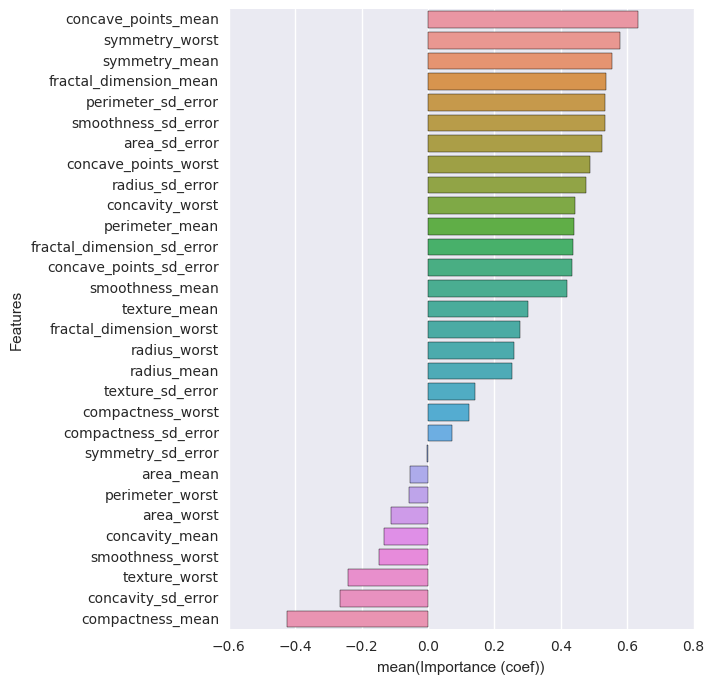

In [473]:
#Look at the most important features with both positive and negative correlation to the target variable.
f, ax = plt.subplots(figsize=(6, 8))
sns.barplot(x='Importance (coef)', y='Features', data=log_features)

### Analyze the impact of features on the outlier dataset.

OUTLIER DATA SET:

THIS VISUALIZATION SHOWS THE POSITIVE AND NEGATIVE CORRELATIONS OF EACH CATEGORY TO WHETHER OR NOT A TUMOR WAS MALIGNENT.

In [470]:
logistic1_coef = []
for i in logistic1.coef_.tolist():
    for j in i:
        logistic1_coef.append(j)
print len(logistic1_coef)

30


In [471]:
log_features1 = pd.DataFrame(columns=['Features', 'Importance (coef)'])
log_features1['Features'] = X3_train.columns
log_features1['Importance (coef)'] = logistic1_coef
log_features1.sort_values('Importance (coef)', ascending=False, inplace=True)

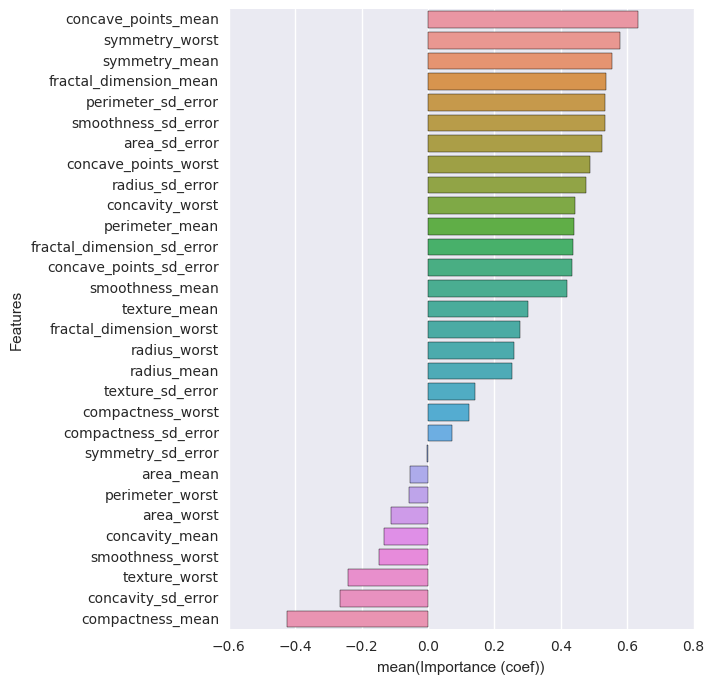

In [474]:
#Look at the most important features with both positive and negative correlation to the target variable.
f, ax = plt.subplots(figsize=(6, 8))
sns.barplot(x='Importance (coef)', y='Features', data=log_features)

## Summary

- The lazy_model resulted in more false positives and also false negatives. The result of this would be that individuals who had malignent tumors would be told they were benign and vice versa. This would result in more costs being incurred by the hospital that were needless and more importantly could be life threatening to someone whose tumor was actually malignent.


- The main obstacle then for the model to overcome is to account for the different outliers that are in this data set.


- To do this we ran a clustering algorithm that looked at every pair-wise comparison of the columns in this data frame.


- The clustering algorithm then assigned an "outlier_score" to each patient(data_row).


- We summed all the columns into one total_outlier_score and split the dataframe into two new dataframes. Patients whose tumors could be considered outliers compared to the main population and patients whose tumors followed the main population trends.


- After the split we trained a logistic regression predictive model on each dataframe. These models were then able to treat the groups with specialized care and account for the nuances that both populations were presenting.


- The result was our model accuractly caught ALL the malignent tumors. There were no false negatives in contrast to the lazy_models 4 false negative.


- On top of this, our model reduced the number of false positive tumors from 15 in our lazy_model to 2. Therefore, the specialized model resulted in more lives saved.

Nice.

# DSI Instructor Task: Part 2

## Student 1

Comments: 
 - Good job importing libraries "as" something. This will save you time when typing functions later.


- Lookup how to import the linear regression library from the sklearn documentation at the link below. Notice how it looks similar to the way the cross_validation library is imported.
<a href="http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html"> click here for article</a> This is key to getting your model code to run.


- Also, for setting up your model there are some good tutorials here that give some explanation. I encourage you to walk through this one here. <a href="http://chrisalbon.com/machine-learning/linear_regression_scikit-learn.html">tutorial</a>


- Nice job setting up the scoring and then getting the mean of that score.


- Remember when we talked about cross_validation and k_folds? You will want to use more than 1 but how many? ;)

In [1]:
import pandas as pd
import numpy as np
from sklearn import LinearRegression
from sklearn.cross_validation import cross_val_score

ImportError: cannot import name LinearRegression

In [2]:
# Load data
d = pd.read_csv('data/train.csv')

In [3]:
# Setup data for prediction
x1 = data.SalaryNormalized
x2 = pd.get_dummies(data.ContractType)

NameError: name 'data' is not defined

In [4]:
# Setup model
model = LinearRegression()

NameError: name 'LinearRegression' is not defined

In [5]:
# Evaluate model
from sklearn.cross_validation import cross_val_score
from sklearn.cross_validation import train_test_split
scores = cross_val_score(model, x2, x1, cv=1, scoring='mean_absolute_error')
print(scores.mean())

NameError: name 'model' is not defined

# Student 2

Comments:
- Very clean code and importing of the libraries and data. You are showing that you have a good understanding of how to setup the structure of your models. That will save you a lot of headaches.


- Also good execution of setting up a scoring metric to evaluate your models results. Its because you took this step that you know there is something not being calculated accurately in this model. That is half of data science right there, knowing when something is not working as well as it could.


- Remember the assumptions a linear model makes before you can run a linear regression? You will want to review that and see in particular if your X variable fills all those criteria. See what happens to your model when you make the necessary changes there.



In [6]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.cross_validation import cross_val_score

In [7]:
# Load data
data = pd.read_csv('data/train.csv')

In [8]:
# Setup data for prediction
y = data.SalaryNormalized
X = pd.get_dummies(data.ContractType)

In [9]:
# Setup model
model = LinearRegression()

In [10]:
# Evaluate model
scores = cross_val_score(model, X, y, cv=5, scoring='mean_absolute_error')
print(scores.mean())

-11822.1402313
